In [1]:
# LOAD LIBRARIES
from scipy import stats
import galpy.potential
from galpy.orbit import Orbit
from astropy import units as u
from galpy.potential import LogarithmicHaloPotential
import numpy as np
from galpy.potential import MWPotential2014,PowerSphericalPotential
#from galpy.potential import FerrersPotential,DehnenBarPotential
import matplotlib.pyplot as plt
#import gala.integrate as gi
#import gala.dynamics as gd
#import gala.potential as gp
#from gala.units import galactic
import astropy.units as u
from orbit_functions import *
import pickle
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from scipy.ndimage import gaussian_filter
from galpy.potential import plotRotcurve
from functools import partial
from scipy.fft import *
from scipy import interpolate, optimize
from astropy.io import fits
from astropy.table import Table, join

plt.rcParams['font.size'] = 12

# DATA LOADER
class Loader():
    o_cache = None
    o_cache_name = None
    oo = None
    oo_age = None
    oo_orbit = None
    new = False

    def load_model(self, model, time, xmin=1000, xmax=3000, phi_range=0.2, maxvr=20):
        
        if model == 'MW_Sgr':
            Rmax=16.
            snap=str(int(np.round(time*100))) if time>=1 else '0'+str(int(time*100))
            df = Table.read('MW_Sgr/disk'+snap+'.fits', format='fits').to_pandas()
            df['X'],df['Y'],df['Z'],df['VX'],df['VY'],df['VZ']=cyl2cart(df['R'],df['phi'],df['Z'],df['VR'],df['Vphi'],df['VZ'])
            ind=df['R']<Rmax
            df=df[ind]    
            x,y,z,VR,Vphi,VZ,R,phi=df['X'],df['Y'],df['Z'],df['VR'],df['Vphi'],df['VZ'],df['R'],df['phi']
            Vphi=Vphi*-1.
            Lz=R*Vphi
        else:
            if self.o_cache_name == model:
                o = self.o_cache
            else:
                file='o_galpy/o_'+model+'.pkl'
                with open(file, 'rb') as f:#for orbits after perturbation
                    o = pickle.load(f)
                self.o_cache = o
                self.o_cache_name = model

            t=time*u.Gyr
            x=o.x(t)
            y=-o.y(t)#in galpy, orbits turn counterclockwise. changing sign of y we turn it into clockwise
            VR=o.vr(t)
            Vphi=o.vphi(t)*o.r(t)
            R=o.r(t)
            Lz=R*Vphi
            phi=o.phi(t)
            z=None
            VZ=None

        indphi=(np.abs(phi)>np.pi-phi_range)&(np.abs(phi)<np.pi+phi_range)
        indphi&=(np.abs(VR)<maxvr)&(Lz>xmin)&(Lz<xmax)
        x,y,z,VR,Vphi,VZ,R,Lz,phi=x[indphi],y[indphi],z[indphi] if z else None,VR[indphi],Vphi[indphi],VZ[indphi] if VZ else None,R[indphi],Lz[indphi],phi[indphi]
        DATA = False
        
        return x,y,z,VR,Vphi,VZ,R,Lz,phi

    def load_data(self, xmin=1500, xmax=3500, phi_range=0.4, new=True):
        if self.oo == None or self.new != new:
            path = 'o_galpy/SoS_SH_Gaia_test_GAL6D.fits'
            if new:
                path = 'o_galpy/DR3_SH_ruwe14_fidelity05_pioe5_GAL6D.fits'
            self.oo = Table.read(path, format='fits')
        oo = self.oo

        VR,Vphi,VZ,x,y,z,R,phi=np.array((oo['VR'],oo['Vphi'],oo['VZ'],oo['X'],oo['Y'],oo['Z'],oo['R'],oo['phi']))
        Lz=-oo['Vphi']*oo['R']
        phi=-np.deg2rad(phi)
        Vphi=-Vphi
        
        indphi = abs(phi) < phi_range
        x,y,z,VR,Vphi,VZ,R,Lz,phi=x[indphi],y[indphi],z[indphi],VR[indphi],Vphi[indphi],VZ[indphi],R[indphi],Lz[indphi],phi[indphi]
        indphi=(Lz>xmin)&(Lz<xmax)
        x,y,z,VR,Vphi,VZ,R,Lz,phi=x[indphi],y[indphi],z[indphi],VR[indphi],Vphi[indphi],VZ[indphi],R[indphi],Lz[indphi],phi[indphi]
        
        DATA = True
        return x,y,z,VR,Vphi,VZ,R,Lz,phi
    
    def load_data_ages(self, xmin=1500, xmax=3500, phi_range=0.4):
        #path = 'o_galpy/DR3_SH_ruwe14_fidelity05_pioe5_GAL6D.fits'
        #oo = Table.read(path, format='fits')
        #ages = Table.read('o_galpy/agesGDR3RVS_reduced.fits')
        #joined = join(oo,ages,keys='source_id')
        #print(joined.colnames)
        #print(joined)
        #joined.write('o_galpy/agesGDR3RVS_joined.fits', format='fits')
        #return
        #path = 'o_galpy/agesGDR3RVS_joined.fits'
        #oo = Table.read(path, format='fits')
        #indphi = ~np.isnan(np.array(oo['age']))
        #clean = oo[indphi]
        #clean.write('o_galpy/agesGDR3RVS_clean.fits', format='fits')
        #return
        
        if self.oo_age is None:
            path = 'o_galpy/agesGDR3RVS_clean.fits'
            self.oo_age = Table.read(path, format='fits')
        oo = self.oo_age

        VR,Vphi,VZ,x,y,z,R,phi,age,age_error=np.array((oo['VR'],oo['Vphi'],oo['VZ'],oo['X'],oo['Y'],oo['Z'],oo['R'],oo['phi'],oo['age'],oo['age_error']))
        Lz=-oo['Vphi']*oo['R']
        phi=-np.deg2rad(phi)
        Vphi=-Vphi
        
        indphi = abs(phi) < phi_range
        indphi &= (Lz>xmin)&(Lz<xmax)
        x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error=x[indphi],y[indphi],z[indphi],VR[indphi],Vphi[indphi],VZ[indphi],R[indphi],Lz[indphi],phi[indphi],age[indphi],age_error[indphi]
        
        DATA = True
        return x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error
    
    def load_data_orbits(self, xmin=1500, xmax=3500, phi_range=0.4):
        if self.oo_orbit is None:
            path = 'o_galpy/orbitsGDR3RVS_joined.fits'
            self.oo_orbit = Table.read(path, format='fits')
        oo = self.oo_orbit

        VR,Vphi,VZ,x,y,z,R,phi,Zmax,Jz,Jr=np.array((oo['VR'],oo['Vphi'],oo['VZ'],oo['X'],oo['Y'],oo['Z'],oo['R'],oo['phi'],oo['Zmax_med_dgeo'],oo['Jz_med_dgeo'],oo['Jr_med_dgeo']))
        Lz=-oo['Vphi']*oo['R']
        phi=-np.deg2rad(phi)
        Vphi=-Vphi
        
        indphi = abs(phi) < phi_range
        indphi &= (Lz>xmin)&(Lz<xmax)
        x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr=x[indphi],y[indphi],z[indphi],VR[indphi],Vphi[indphi],VZ[indphi],R[indphi],Lz[indphi],phi[indphi],Zmax[indphi],Jz[indphi],Jr[indphi]
        
        DATA = True
        return x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr
    
l = Loader()


# AUXILIARY_FUNCTIONS

def smooth_bins(x, y, xmin, xmax, binsize, calc_error=False):
    binsLZ=np.arange(xmin,xmax,binsize)
    m,xedge,binnumber=stats.binned_statistic(x, y, statistic='mean', bins=[binsLZ]) 
    nx = np.arange(xmin-binsize/2, xmax, binsize)
    xpol = nx + binsize/2
    means = []
    error = []
    for k in nx:
        rel = y[(k<x) & (x<k+binsize)]
        if len(rel) == 0:
            means.append(means[-1])
            error.append(error[-1])
        else:
            means.append(np.mean(rel))
            err = np.std(rel)/np.sqrt(len(rel))
            error.append(err)
    ypol = np.array(means)
    error = np.array(error)
    if calc_error:
        return xpol, ypol, error
    return xpol, ypol


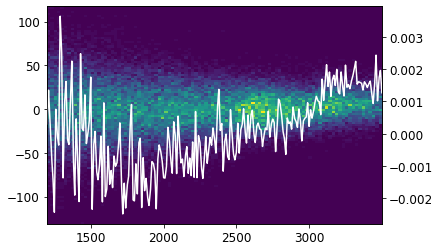

In [48]:
# Plot Vz in relation to Lz in the MW_Sgr simulation

TIME = 3.0
XMIN=1200
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model('MW_Sgr', TIME, xmin=XMIN, xmax=XMAX, phi_range=0.2)
DATA = False

plt.hist2d(Lz, VZ, bins=100);

nx, ny = smooth_bins(Lz, VZ/Lz, XMIN, XMAX, BINSIZE)
N = 100000
P = 1
f = interpolate.interp1d(nx, ny, kind='linear')
xpol = np.linspace(nx[0], nx[-1], N)
ypol = f(xpol)
xpol = xpol[~np.isnan(ypol)]
ypol = ypol[~np.isnan(ypol)]
N = len(ypol)
ax_right = plt.twinx()
ax_right.plot(xpol, ypol, c='white')

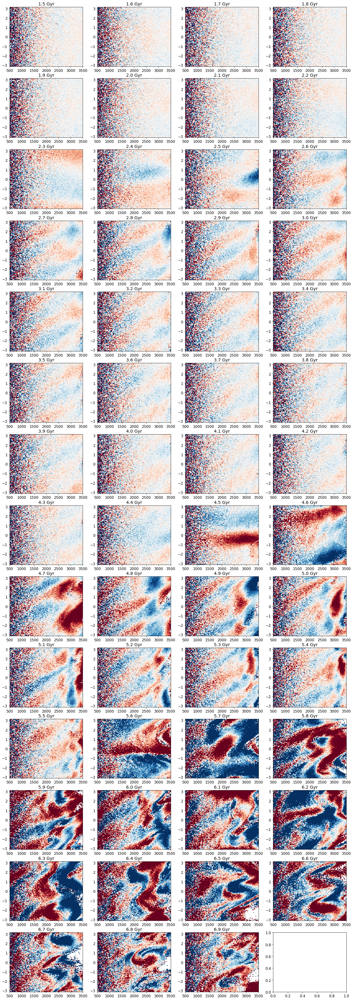

In [78]:
# Plot Vz in relation to Lz, angle and time in the MW_Sgr simulation

fig, ax = plt.subplots(14,4,figsize=(20,60))

for i, TIME in enumerate(np.arange(1.5, 7.0, 0.1)):
    XMIN=500
    XMAX=3500
    BINSIZE = 10
    x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model('MW_Sgr', TIME, xmin=XMIN, xmax=XMAX, phi_range=np.pi)
    DATA = False

    binsY=np.linspace(-np.pi,np.pi,100)
    mVR,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, VZ/Lz, statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
    rax = ax[i//4][i%4]
    rax.pcolormesh(xedge, yedge, mVR.T, cmap='RdBu',vmin=-10/2000,vmax=10/2000)
    rax.set_title(f'{TIME:.2} Gyr')

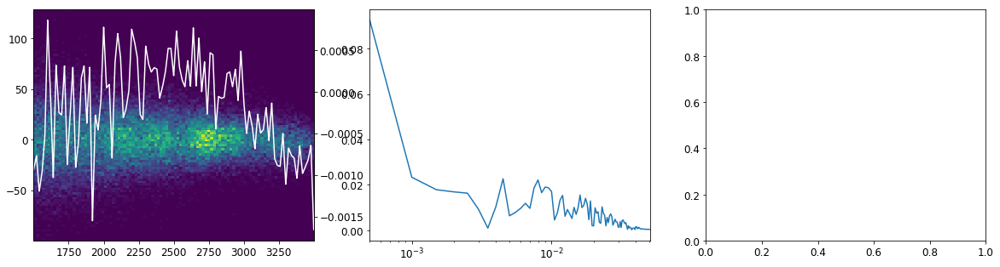

In [90]:
# Fourier transform of Vz in relation to Lz, for MW_Sgr

fig, ax = plt.subplots(1,3,figsize=(20,5))

TIME = 4.0
XMIN=1500
XMAX=3500
BINSIZE = 20
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model('MW_Sgr', TIME, xmin=XMIN, xmax=XMAX, phi_range=0.2)
DATA = False

ax[0].hist2d(Lz, VZ, bins=100);

nx, ny = smooth_bins(Lz, VZ/Lz, XMIN, XMAX, BINSIZE)
N = 100000
P = 1
f = interpolate.interp1d(nx, ny, kind='linear')
xpol = np.linspace(nx[0], nx[-1], N)
ypol = f(xpol)
xpol = xpol[~np.isnan(ypol)]
ypol = ypol[~np.isnan(ypol)]
N = len(ypol)
ax_right = ax[0].twinx()
ax_right.plot(xpol, ypol, c='white')

ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
yf = fft(ypol)
xf = fftfreq(N)
yf = yf[xf>0]
xf = xf[xf>0]

xfr = ((nx[-1]-nx[0]) / abs(xf * N))
ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)))
ax[1].set_xlim(1/max(xfr), 1/xfr[100])
ax[1].set_xscale('log')
#ax[0][1].xaxis.set_major_formatter(ticker.ScalarFormatter())
ax[1].set_aspect('auto')

In [72]:
# Evolution of Fourier transform of Vz with time (part 1)

times = np.arange(0.1, 7.0, 0.1)
vtimes = list(times)

binsizes = [10]
for tfi, tf in enumerate([lambda x: x]):
    fourier = []
    freqs = []
    freqs2 = []
    for time in times:
        print(time)

        #XMIN=1200
        #XMAX=3500
        #BINSIZE = 10
        #x,y,VR,Vphi,R,Lz,phi=l.load_model(CURMODEL, time, xmin=XMIN, xmax=XMAX, phi_range=0.2)

        XMIN=1000
        XMAX=3500
        BINSIZE = 10
        x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model('MW_Sgr', time, xmin=XMIN, xmax=XMAX, phi_range=0.2)
        
        DATA = False

        nx, ny = smooth_bins(tf(Lz), VZ/Lz, np.min(tf(Lz)), np.max(tf(Lz)), binsizes[tfi])
        N = 100000
        f = interpolate.interp1d(nx, ny, kind='linear')
        xpol = np.linspace(nx[0], nx[-1], N)
        ypol = f(xpol)
        xpol = xpol[~np.isnan(ypol)]
        ypol = ypol[~np.isnan(ypol)]
        N = len(ypol)

        ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
        yf = fft(ypol)
        xf = fftfreq(N)
        yf = yf[xf>0]
        xf = xf[xf>0]
        xfr = ((nx[-1]-nx[0]) / abs(xf * N))
        fourier.append(yf)

    np.save(f'fourier_time_z_10_35_{tfi}.npy', fourier)
    np.save(f'xfr_time_z_10_35_{tfi}.npy', xfr)
    

0.1
0.2
0.30000000000000004
0.4
0.5
0.6
0.7000000000000001
0.8
0.9
1.0
1.1
1.2000000000000002
1.3000000000000003
1.4000000000000001
1.5000000000000002
1.6
1.7000000000000002
1.8000000000000003
1.9000000000000001
2.0
2.1
2.2
2.3000000000000003
2.4000000000000004
2.5000000000000004
2.6
2.7
2.8000000000000003
2.9000000000000004
3.0000000000000004
3.1
3.2
3.3000000000000003
3.4000000000000004
3.5000000000000004
3.6
3.7
3.8000000000000003
3.9000000000000004
4.0
4.1
4.2
4.3
4.3999999999999995
4.5
4.6
4.7
4.8
4.9
5.0
5.1
5.2
5.3
5.4
5.5
5.6
5.7
5.8
5.9
6.0
6.1
6.2
6.3
6.4
6.5
6.6
6.7
6.8
6.9


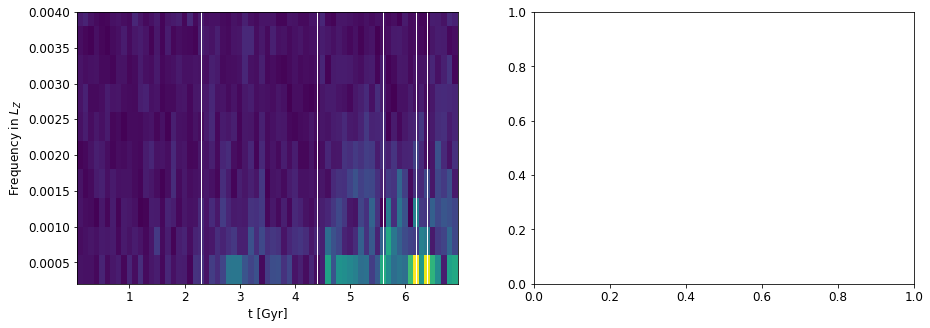

In [138]:
# (part 2)

fig, ax = plt.subplots(1,2,figsize=(15,5))
times = np.arange(0.1, 7.0, 0.1)
ylims = [[0.00020,0.004], [5000,60000]]
desc = ["L_Z", r"L_Z^{\frac{n+1}{n-1}}"]
for tfi in range(1):
    fourier = np.load(f'fourier_time_z_10_35_{tfi}.npy')
    xfr = np.load(f'xfr_time_z_10_35_{tfi}.npy')
    fourier = np.abs(np.array(fourier))
    xfr = xfr[:100]
    fourier = fourier[:,:100]

    Z = fourier.T/np.sum(fourier, axis=1)
    ax[tfi].pcolormesh(times, 1/xfr, Z, cmap='viridis')
    ax[tfi].set_xlabel('t [Gyr]')
    ax[tfi].set_ylabel(fr'Frequency in ${desc[tfi]}$')
    ax[tfi].set_ylim(*ylims[tfi])
   
    for peri in [2.3, 4.4, 5.6, 6.2, 6.4]:
        ax[tfi].axvline(peri, c='w', lw=1)

    #plt.plot(vtimes, np.array(freqs), color='w')

    #fit = np.polyfit(vtimes, 1/np.array(freqs), 1)
    #pol = np.poly1d(fit)
    ##plt.plot(times[1/pol(times) < max(y_coords)], 1/pol(times)[1/pol(times)<max(y_coords)], c='w')
    #ax[model_i].plot(times, pol(times), c='w')
#
    #if model == 'Dhot_log_2perturb':
    #    fit = np.polyfit(vtimes, 1/np.array(freqs2), 1)
    #    pol = np.poly1d(fit)
    #    #plt.plot(times[1/pol(times) < max(y_coords)], 1/pol(times)[1/pol(times)<max(y_coords)], c='w', ls='--')
    #    ax[model_i].plot(times, pol(times), c='w', ls='--')




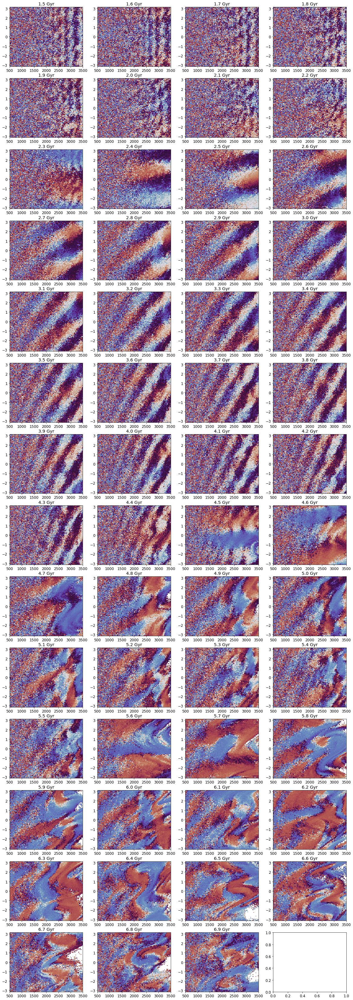

In [115]:
# Plot angle of velocity vector

fig, ax = plt.subplots(14,4,figsize=(20,60))

for i, TIME in enumerate(np.arange(1.5, 7.0, 0.1)):
    XMIN=500
    XMAX=3500
    BINSIZE = 10
    x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model('MW_Sgr', TIME, xmin=XMIN, xmax=XMAX, phi_range=np.pi)
    DATA = False

    binsY=np.linspace(-np.pi,np.pi,100)
    vf = VR + 1j*VZ
    mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
    mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
    mVR = mVR_r + 1j * mVR_c
    rax = ax[i//4][i%4]
    rax.pcolormesh(xedge, yedge, np.angle(mVR.T), cmap='twilight',vmin=-np.pi,vmax=np.pi)
    rax.set_title(f'{TIME:.2} Gyr')

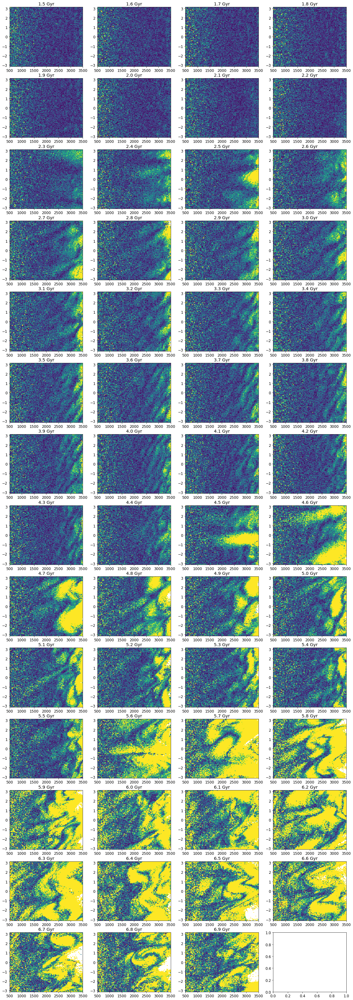

In [113]:
# Plot module of velocity vector

fig, ax = plt.subplots(14,4,figsize=(20,60))

for i, TIME in enumerate(np.arange(1.5, 7.0, 0.1)):
    XMIN=500
    XMAX=3500
    BINSIZE = 10
    x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model('MW_Sgr', TIME, xmin=XMIN, xmax=XMAX, phi_range=np.pi)
    DATA = False

    binsY=np.linspace(-np.pi,np.pi,100)
    vf = VR + 1j*VZ
    mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
    mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
    mVR = mVR_r + 1j * mVR_c
    rax = ax[i//4][i%4]
    rax.pcolormesh(xedge, yedge, np.abs(mVR.T), cmap='viridis',vmin=0,vmax=10)
    rax.set_title(f'{TIME:.2} Gyr')

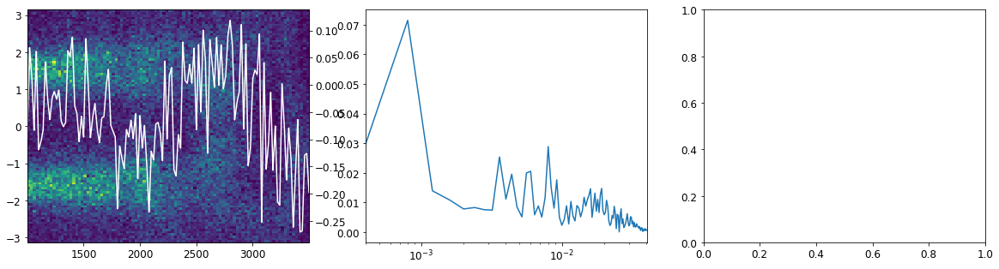

In [205]:
fig, ax = plt.subplots(1,3,figsize=(20,5))

TIME = 3.5
XMIN=1000
XMAX=3500
BINSIZE = 20
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model('MW_Sgr', TIME, xmin=XMIN, xmax=XMAX, phi_range=0.2)
DATA = False

vf = VR + 1j*VZ
#vf = vf/Lz

ax[0].hist2d(Lz, np.angle(vf), bins=100);

nx, ny = smooth_bins(Lz, np.angle(vf), XMIN, XMAX, BINSIZE)
N = 100000
P = 1
f = interpolate.interp1d(nx, ny, kind='linear')
xpol = np.linspace(nx[0], nx[-1], N)
ypol = f(xpol)
xpol = xpol[~np.isnan(ypol)]
ypol = ypol[~np.isnan(ypol)]
N = len(ypol)
ax_right = ax[0].twinx()
ax_right.plot(xpol, ypol, c='white')

ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
yf = fft(ypol)
xf = fftfreq(N)
yf = yf[xf>0]
xf = xf[xf>0]

xfr = ((nx[-1]-nx[0]) / abs(xf * N))
ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)))
ax[1].set_xlim(1/max(xfr), 1/xfr[100])
ax[1].set_xscale('log')
#ax[0][1].xaxis.set_major_formatter(ticker.ScalarFormatter())
ax[1].set_aspect('auto')

/home/hpc/anaconda3/lib/python3.9/site-packages/astropy/table/table.py:3488: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  result = self.as_array() == other

0.0003333333333333333
[0.00033333 0.00066667 0.001      0.00133333 0.00166667 0.002
 0.00233333 0.00266667 0.003      0.00333333]
[0.0004714  0.0008165  0.0011547  0.00149071 0.00182574 0.00216025
 0.00249444 0.00282843 0.00316228 0.00349603]
-1.2222222222222223
2192.9824561403575
[ 2192.98245614  4385.96491228  6578.94736842  8771.92982456
 10964.9122807  13157.89473684 15350.87719298 17543.85964912
 19736.84210526 21929.8245614 ]
[ 3101.34553152  5371.68803242  7596.71406828  9807.31569079
 12011.45959441 14212.1506544  16410.77801217 18608.07318912
 20804.45829058 23000.19403882]


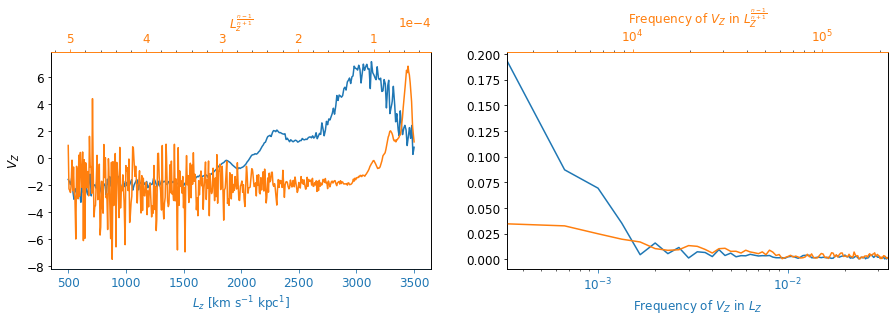

In [77]:
XMIN=500
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=0.2, new=True)
DATA = True

fig, ax = plt.subplots(1,2,figsize=(15,4))

nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, BINSIZE)
N = 100000
P = 1
f = interpolate.interp1d(nx, ny, kind='linear')
xpol = np.linspace(nx[0], nx[-1], N)
ypol = f(xpol)
xpol = xpol[~np.isnan(ypol)]
ypol = ypol[~np.isnan(ypol)]
N = len(ypol)
#ax_right = ax[0][0].twinx()
#ax_right.plot(xpol, ypol, c='white')
#ax_right.set_ylabel('$L_z/V_R$')
ax[0].plot(xpol, ypol, c='C0')
ax[0].set_aspect('auto')
ax[0].spines['bottom'].set_color('C0')
ax[0].tick_params(axis='x', colors='C0')
ax[0].set_xlabel(r'$L_z$ [km s$^{-1}$ kpc$^{1}$]')
ax[0].spines['top'].set_color('C1')
ax[0].xaxis.label.set_color('C0')
ax[0].set_ylabel(r'$V_Z$')

ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
yf = fft(ypol)
xf = fftfreq(N)
yf = yf[xf>0]
xf = xf[xf>0]

xfr = ((nx[-1]-nx[0]) / abs(xf * N))
print(1/xfr[np.argmax(np.abs(yf))])
ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)), color='C0')
ax[1].set_xlim(1/max(xfr), 1/xfr[100])
ax[1].set_xscale('log')
#ax[1].xaxis.set_major_formatter(ticker.ScalarFormatter())
ax[1].set_aspect('auto')
ax[1].set_xlabel('Frequency of $V_Z$ in $L_Z$')
ax[1].spines['top'].set_color('C1')
ax[1].tick_params(axis='x', colors='C0')
ax[1].xaxis.label.set_color('C0')
print(1/xfr[:10])
avgs = np.sqrt(xfr[1:] * xfr[:-1])
print(1/avgs[:10])

#ax[1].errorbar(x=1/xfr[1], y=0.00, xerr=[[abs(1/xfr[1]-1/avgs[0])], [abs(1/xfr[1]-1/avgs[1])]], color='C0', capsize=5)
#ax[1].errorbar(x=1/xfr[6], y=0.00, xerr=[[abs(1/xfr[6]-1/avgs[5])], [abs(1/xfr[6]-1/avgs[6])]], color='C0', capsize=5)


n = -0.1
print((n-1)/(n+1))
nx, ny = smooth_bins(Lz**((n-1)/(n+1)), VZ, np.min(Lz**((n-1)/(n+1))), np.max(Lz**((n-1)/(n+1))), 1e-6)
N = 100000
f = interpolate.interp1d(nx, ny, kind='linear')
xpol = np.linspace(nx[0], nx[-1], N)
ypol = f(xpol)
xpol = xpol[~np.isnan(ypol)]
ypol = ypol[~np.isnan(ypol)]
N = len(ypol)
#ax_right = ax[2][0].twiny()
#ax_right.set_xlabel('$L_z^{-1}$')
#ax_right = ax_right.twinx()
#ax_right.plot(xpol, ypol, c='white')
#ax_right.set_ylabel('$L_z/V_R$')
axb = ax[0].twiny()
axb.plot(xpol, ypol, c='C1')
#axb.spines['top'].set_position(('outward', 40))
axb.spines['top'].set_color('C1')
axb.tick_params(axis='x', colors='C1')
axb.set_xlabel(r'$L_z^\frac{n-1}{n+1}$')
axb.xaxis.label.set_color('C1')
axb.set_xlim(axb.get_xlim()[::-1])
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
axb.xaxis.set_minor_locator(AutoMinorLocator())
plt.ticklabel_format(style='sci', axis='x', scilimits=(1e-3,1e4))


ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
yf = fft(ypol)
xf = fftfreq(N)
yf = yf[xf>0]
xf = xf[xf>0]

xfr = ((nx[-1]-nx[0]) / abs(xf * N))
axb = ax[1].twiny()
axb.plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)), color='C1')
print(1/xfr[np.argmax(np.abs(yf))])
axb.set_xlim(1/max(xfr), 1/xfr[100])
axb.set_xscale('log')
#ax[2].xaxis.set_major_formatter(ticker.ScalarFormatter())
axb.set_aspect('auto')
axb.set_xlabel(r'Frequency of $V_Z$ in $L_Z^{\frac{n-1}{n+1}}$')
axb.spines['top'].set_color('C1')
axb.tick_params(axis='x', colors='C1')
axb.xaxis.label.set_color('C1')

print(1/xfr[:10])
avgs = np.sqrt(xfr[1:] * xfr[:-1])
print(1/avgs[:10])
#axb.vlines(x=1/avgs[0], ymin=0, ymax=0.125, c='C1', ls='-')
#axb.axvspan(1/avgs[1], 1/avgs[5], color='C1', alpha=0.2)
#axb.axvspan(0, 1/avgs[0], color='C1', alpha=0.2)

#axb.errorbar(x=0, y=0.075, xerr=[[0], [1/avgs[0]]], color='C1', capsize=5)
#axb.errorbar(x=1/avgs[3], y=0.075, xerr=[[abs(1/avgs[3]-1/avgs[1])], [abs(1/avgs[3]-1/avgs[5])]], color='C1', capsize=5)


#for i in range(1,4):
#    ax[i].set_ylim(0,0.175)


0.0003333333333333333
[0.00033333 0.00066667 0.001      0.00133333 0.00166667 0.002
 0.00233333 0.00266667 0.003      0.00333333]
[0.0004714  0.0008165  0.0011547  0.00149071 0.00182574 0.00216025
 0.00249444 0.00282843 0.00316228 0.00349603]


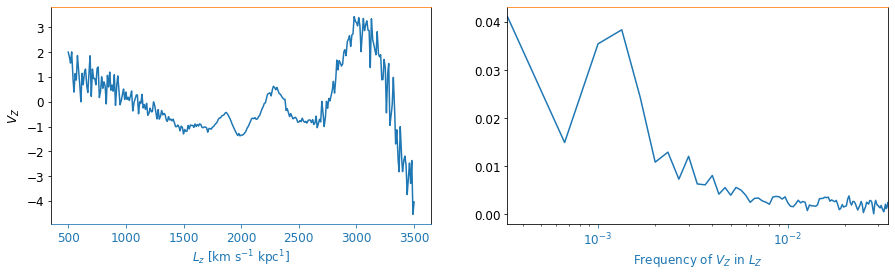

In [76]:
XMIN=500
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=0.2, new=True)
DATA = True

fig, ax = plt.subplots(1,2,figsize=(15,4))
#fig = plt.figure(figsize=(15,4))
#subfigs = fig.subfigures(1, 2, wspace=0, width_ratios=(1,2))
#ax = []
#ax.append(subfigs[0].add_subplot(111))
#gs = subfigs[1].add_gridspec(1,2, hspace=0., wspace=0.)
#ax.extend(gs.subplots(sharey=True))
#fig, axs = plt.subplots(1,4,figsize=(15,4))
#gs = axs[1:3].get_gridspec()
#for ax in axs[1:3]:
#    ax.remove()
#ax = axs[0] + gs.subplots(sharey=True)

nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, BINSIZE)
N = 100000
#f = interpolate.interp1d(nx, ny, kind='linear')
#xpol = np.linspace(nx[0], nx[-1], N)
#ypol = f(xpol)
#for i in range(3):
#    ax[i][0].hist2d(Lz[abs(VR)<40], VR[abs(VR)<40], bins=100);
#    ax[i][0].set_aspect('auto')
#    ax[i][0].set_xlabel(r'$L_Z$  [km s$^{-1}$ kpc$^{1}$]')
#    ax[i][0].set_ylabel(r'$V_R$ [km s$^{-1}$] ')

nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, BINSIZE)
pf = np.polyfit(nx, ny, 1)
ny -= np.poly1d(pf)(nx)
N = 100000
P = 1
f = interpolate.interp1d(nx, ny, kind='linear')
xpol = np.linspace(nx[0], nx[-1], N)
ypol = f(xpol)
xpol = xpol[~np.isnan(ypol)]
ypol = ypol[~np.isnan(ypol)]
N = len(ypol)
#ax_right = ax[0][0].twinx()
#ax_right.plot(xpol, ypol, c='white')
#ax_right.set_ylabel('$L_z/V_R$')
ax[0].plot(xpol, ypol, c='C0')
ax[0].set_aspect('auto')
ax[0].spines['bottom'].set_color('C0')
ax[0].tick_params(axis='x', colors='C0')
ax[0].set_xlabel(r'$L_z$ [km s$^{-1}$ kpc$^{1}$]')
ax[0].spines['top'].set_color('C1')
ax[0].xaxis.label.set_color('C0')
ax[0].set_ylabel(r'$V_Z$')

ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
yf = fft(ypol)
xf = fftfreq(N)
yf = yf[xf>0]
xf = xf[xf>0]

xfr = ((nx[-1]-nx[0]) / abs(xf * N))
print(1/xfr[np.argmax(np.abs(yf))])
ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)), color='C0')
ax[1].set_xlim(1/max(xfr), 1/xfr[100])
ax[1].set_xscale('log')
#ax[1].xaxis.set_major_formatter(ticker.ScalarFormatter())
ax[1].set_aspect('auto')
ax[1].set_xlabel('Frequency of $V_Z$ in $L_Z$')
ax[1].spines['top'].set_color('C1')
ax[1].tick_params(axis='x', colors='C0')
ax[1].xaxis.label.set_color('C0')
print(1/xfr[:10])
avgs = np.sqrt(xfr[1:] * xfr[:-1])
print(1/avgs[:10])

#ax[1].errorbar(x=1/xfr[1], y=0.00, xerr=[[abs(1/xfr[1]-1/avgs[0])], [abs(1/xfr[1]-1/avgs[1])]], color='C0', capsize=5)
#ax[1].errorbar(x=1/xfr[6], y=0.00, xerr=[[abs(1/xfr[6]-1/avgs[5])], [abs(1/xfr[6]-1/avgs[6])]], color='C0', capsize=5)




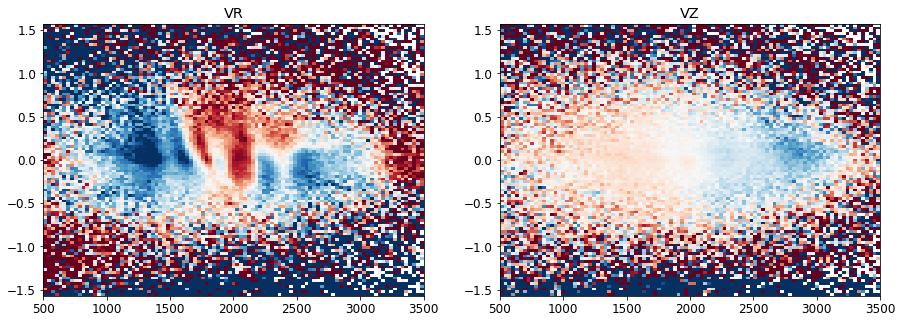

In [17]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=500
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=np.pi, new=False)
DATA = False

binsY=np.linspace(-np.pi/2,np.pi/2,100)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.real(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_title('VR')
ax[1].pcolormesh(xedge, yedge, np.imag(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[1].set_title('VZ');

Text(0, 0.5, 'phi')

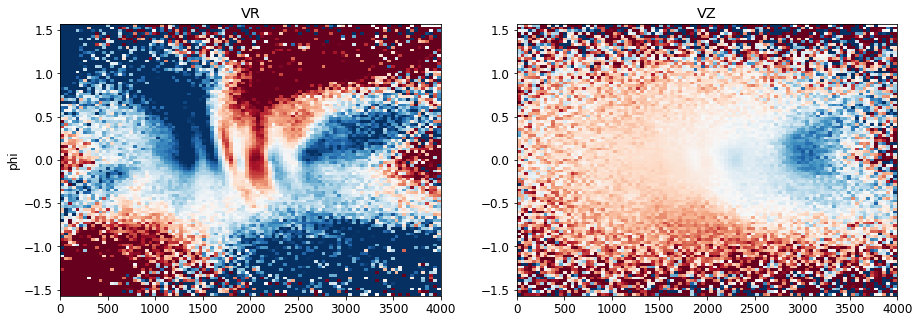

In [85]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=0
XMAX=4000
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=np.pi, new=True)
DATA = False

binsY=np.linspace(-np.pi/2,np.pi/2,100)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.real(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_title('VR')
ax[1].pcolormesh(xedge, yedge, np.imag(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[1].set_title('VZ');
ax[0].set_ylabel('phi')

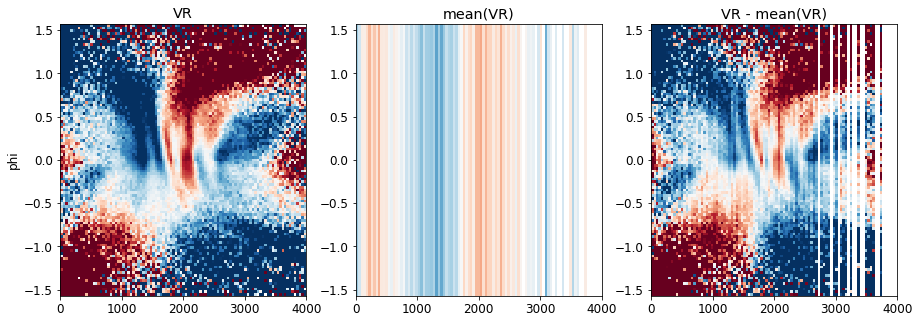

In [99]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

XMIN=0
XMAX=4000
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=0.5*np.pi, new=True)
DATA = False

binsY=np.linspace(-np.pi/2,np.pi/2,100)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.real(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_title('VR')
ax[0].set_ylabel('phi')
meanvr = np.repeat(np.mean(mVR_r,axis=1), len(yedge)-1).reshape(len(xedge)-1,len(yedge)-1)
ax[1].pcolormesh(xedge, yedge, meanvr.T, cmap='RdBu',vmin=-10,vmax=10)
ax[1].set_title('mean(VR)');
mVR_r = mVR_r - meanvr
mVR = mVR_r + 1j * mVR_c
ax[2].pcolormesh(xedge, yedge, np.real(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[2].set_title('VR - mean(VR)');

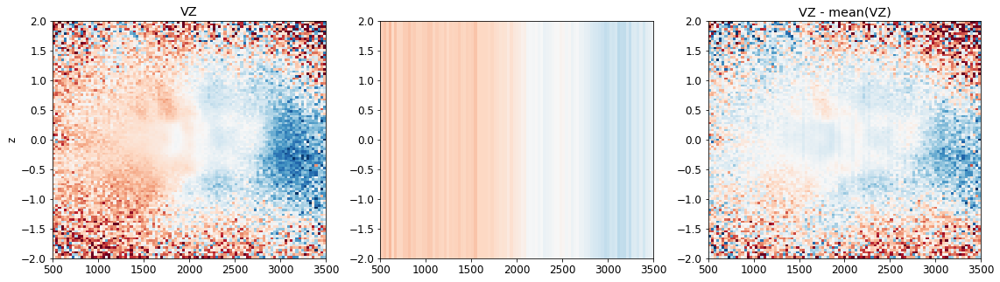

In [100]:
fig, ax = plt.subplots(1,3,figsize=(19,5))

XMIN=500
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=np.pi, new=True)
DATA = False

binsY=np.linspace(-2,2,102)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, z, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, z, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
meanvz = np.repeat(np.mean(mVR_c,axis=1), len(yedge)-1).reshape(len(xedge)-1,len(yedge)-1)
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.imag(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_title('VZ');
ax[0].set_ylabel('z')
ax[1].pcolormesh(xedge, yedge, meanvz.T, cmap='RdBu',vmin=-10,vmax=10)
mVR_c = mVR_c - meanvz
mVR = mVR_r + 1j * mVR_c
ax[2].pcolormesh(xedge, yedge, np.imag(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[2].set_title('VZ - mean(VZ)');

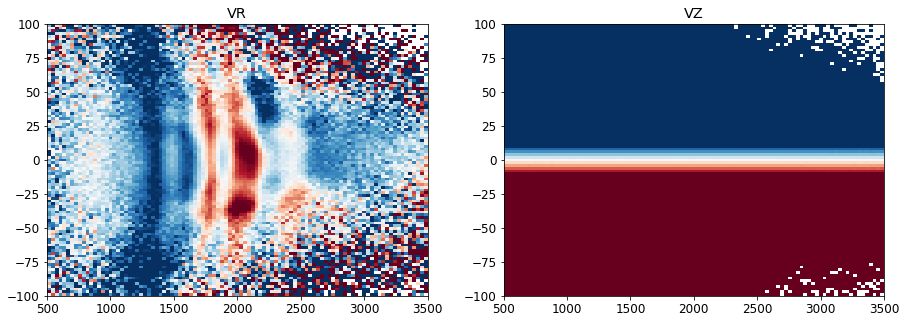

In [42]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=500
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=0.4, new=True)
DATA = False

binsY=np.linspace(-100,100,100)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, VZ, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, VZ, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.real(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_title('VR')
ax[1].pcolormesh(xedge, yedge, np.imag(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[1].set_title('VZ');
ax[0].set_ylabel('VZ')

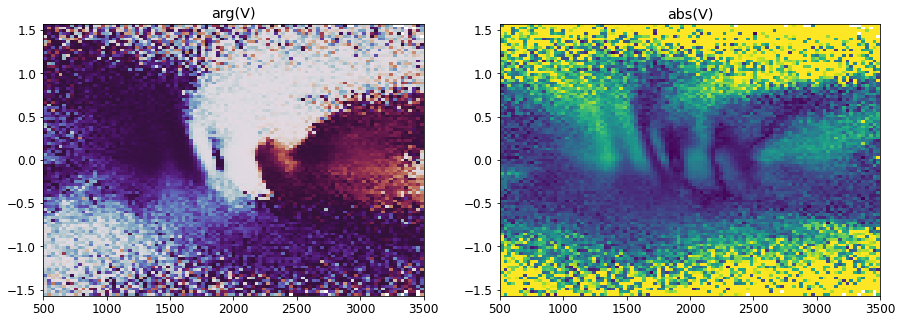

In [22]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=500
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=np.pi)
DATA = False

binsY=np.linspace(-np.pi/2,np.pi/2,100)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.angle(mVR.T), cmap='twilight',vmin=-np.pi,vmax=np.pi)
ax[0].set_title('arg(V)')
ax[1].pcolormesh(xedge, yedge, np.abs(mVR.T), cmap='viridis',vmin=0,vmax=20)
ax[1].set_title('abs(V)');

Text(0, 0.5, '$L_z/V_R$')

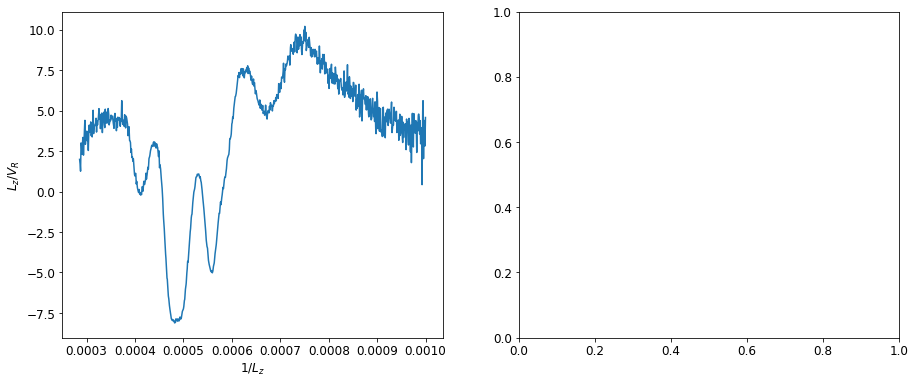

In [28]:
XMIN=1000
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=np.pi, new=True)
ind = z > 0
DATA = True

fig, ax = plt.subplots(1,2,figsize=(15,6))

nx, ny = smooth_bins(1/Lz, VR, 1/XMAX, 1/XMIN, 1e-6)
N = 100000
f = interpolate.interp1d(nx, ny, kind='linear')
xpol = np.linspace(nx[0], nx[-1], N)
ypol = f(xpol)
xpol = xpol[~np.isnan(ypol)]
ypol = ypol[~np.isnan(ypol)]
N = len(ypol)
ax[0].set_xlabel('1/$L_z$')
ax[0].plot(xpol, ypol)
ax[0].set_ylabel('$L_z/V_R$')


#ypol = 5*np.sin(0.02*xpol)
#ax[0].hist2d(np.log10(Lz)**P, VR/Lz, bins=100);
#ax[0].plot(xpol, ypol, c='white')
#ax[0].set_aspect('auto')
#plt.scatter(roots, np.zeros(len(roots)), s=10, color='red', zorder=2)

#ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
#yf = fft(ypol)
#xf = fftfreq(N)
#yf = yf[xf>0]
#xf = xf[xf>0]
#
#
#CUT = 3
#xfr = ((nx[-1]-nx[0]) / abs(xf * N))
##axb = ax[1].twiny()
##axb.set_xlim(xfr[100], max(xfr))
##axb.set_xscale('log')
##axb.xaxis.set_major_formatter(ticker.ScalarFormatter())
##axb.set_xlabel('Wavelength in log($L_z-b$)')
#ax[1].plot(xfr, np.abs(yf)/np.sum(np.abs(yf)))
#print(xfr[abs(yf).argmax()])
##ax[1].plot(xfr[max(0,abs(yf).argmax()-CUT):abs(yf).argmax()+CUT+1], np.abs(yf)[max(0,abs(yf).argmax()-CUT):abs(yf).argmax()+CUT+1]/np.sum(np.abs(yf)))
##ax[1].set_xlim(1e-2, 2.0)
#ax[1].set_xlim(xfr[100], max(xfr))
#ax[1].set_xscale('log')
#ax[1].xaxis.set_major_formatter(ticker.ScalarFormatter())
#ax[1].set_aspect('auto')
#ax[1].set_xlabel('Wavelength of $1/L_z$')
##plt.scatter(roots, np.zeros(len(roots)), s=10, color='red', zorder=2)
##plt.ylim(0, 1)
##plt.show()
##
##CUT = 1

0.10000000149011612 13.5


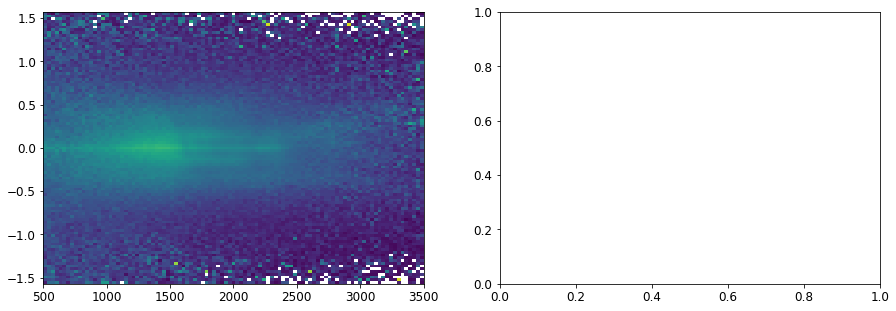

In [22]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=500
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error=l.load_data_ages(xmin=XMIN, xmax=XMAX, phi_range=np.pi)

binsY=np.linspace(-np.pi/2,np.pi/2,100)
mVR,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, age, statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
print(age.min(), age.max())
ax[0].pcolormesh(xedge, yedge, mVR.T, cmap='viridis',vmin=0,vmax=10)


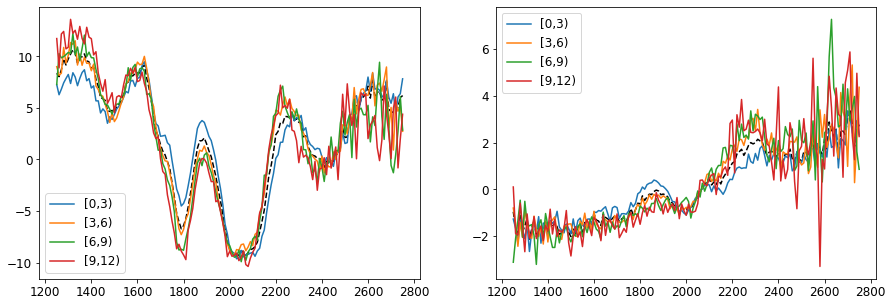

In [193]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error=l.load_data_ages(xmin=XMIN, xmax=XMAX, phi_range=0.4)

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
ax[0].plot(nx,ny,c='k',ls='--')
nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = np.arange(0,13,3)
for low, high in zip(lims[:-1],lims[1:]):
    ind = (low <= age) & (age < high)
    nx, ny = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 10)
    ax[0].plot(nx,ny,label=f'[{low},{high})')
    nx, ny = smooth_bins(Lz[ind], VZ[ind], XMIN, XMAX, 10)
    ax[1].plot(nx,ny,label=f'[{low},{high})')
ax[0].legend()
ax[1].legend()

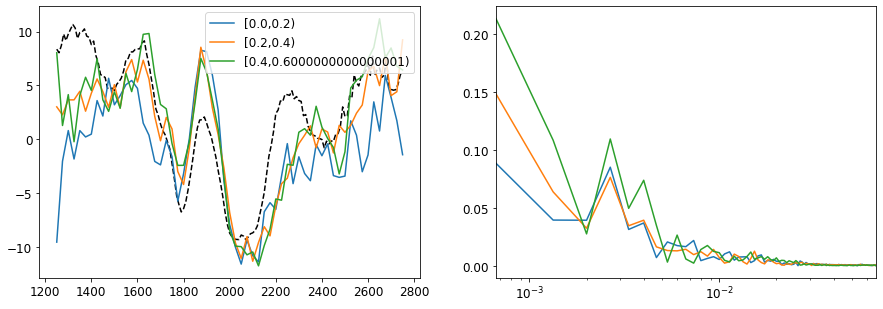

In [183]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error=l.load_data_ages(xmin=XMIN, xmax=XMAX, phi_range=0.4)

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
ax[0].plot(nx,ny,c='k',ls='--')
#nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
#ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = np.arange(0,0.7,0.2)
for low, high in zip(lims[:-1],lims[1:]):
    ind = (low <= age) & (age < high)
    nx, ny = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 25)
    ax[0].plot(nx,ny,label=f'[{low},{high})')
    N = 100000
    f = interpolate.interp1d(nx, ny, kind='linear')
    xpol = np.linspace(nx[0], nx[-1], N)
    ypol = f(xpol)
    xpol = xpol[~np.isnan(ypol)]
    ypol = ypol[~np.isnan(ypol)]
    N = len(ypol)
    ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
    yf = fft(ypol)
    xf = fftfreq(N)
    yf = yf[xf>0]
    xf = xf[xf>0]

    xfr = ((nx[-1]-nx[0]) / abs(xf * N))
    ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)))
    ax[1].set_xlim(1/max(xfr), 1/xfr[100])
    ax[1].set_xscale('log')
ax[0].legend()

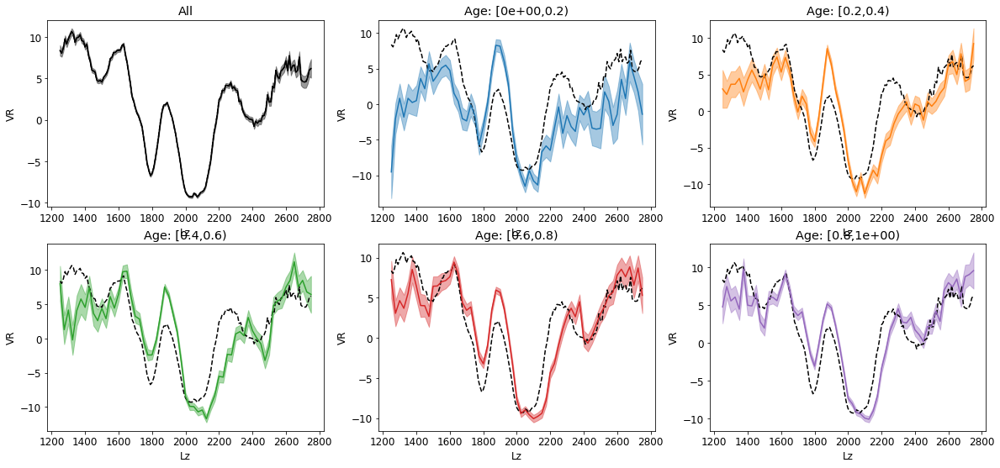

In [12]:
fig, ax = plt.subplots(2,3,figsize=(20,9))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error=l.load_data_ages(xmin=XMIN, xmax=XMAX, phi_range=0.4)

nx, ny, err = smooth_bins(Lz, VR, XMIN, XMAX, 10, calc_error=True)
for aax in ax:
    for aaax in aax:
        aaax.plot(nx,ny,c='k',ls='--')
#ax[0][0].plot(nx,ny+err,c='k',ls='--')
#ax[0][0].plot(nx,ny-err,c='k',ls='--')
ax[0][0].plot(nx,ny,c='k')
ax[0][0].fill_between(nx,ny-err,ny+err,color=f'k',alpha=0.4)
ax[0][0].set_title(f'All')
ax[0][0].set_xlabel('Lz')
ax[0][0].set_ylabel('VR')
#nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
#ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = np.arange(0,1.1,0.2)
for limi, low, high in zip(range(len(lims)), lims[:-1],lims[1:]):
    ind = (low <= age) & (age < high)
    nx, ny, err = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 25, calc_error=True)
    rax = ax[(limi+1)//3][(limi+1)%3]
    rax.plot(nx,ny,c=f'C{limi}')
    #rax.plot(nx,ny+err,ls='--',c=f'C{limi}')
    #rax.plot(nx,ny-err,ls='--',c=f'C{limi}')
    rax.fill_between(nx,ny-err,ny+err,color=f'C{limi}',alpha=0.4)
    rax.set_title(f'Age: [{low:.1},{high:.1})')
    rax.set_xlabel('Lz')
    rax.set_ylabel('VR')
    N = 100000
    f = interpolate.interp1d(nx, ny, kind='linear')
    xpol = np.linspace(nx[0], nx[-1], N)
    ypol = f(xpol)
    xpol = xpol[~np.isnan(ypol)]
    ypol = ypol[~np.isnan(ypol)]
    N = len(ypol)
    #ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
    #yf = fft(ypol)
    #xf = fftfreq(N)
    #yf = yf[xf>0]
    #xf = xf[xf>0]
    #xfr = ((nx[-1]-nx[0]) / abs(xf * N))
    #ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)))
    #ax[1].set_xlim(1/max(xfr), 1/xfr[100])
    #ax[1].set_xscale('log')

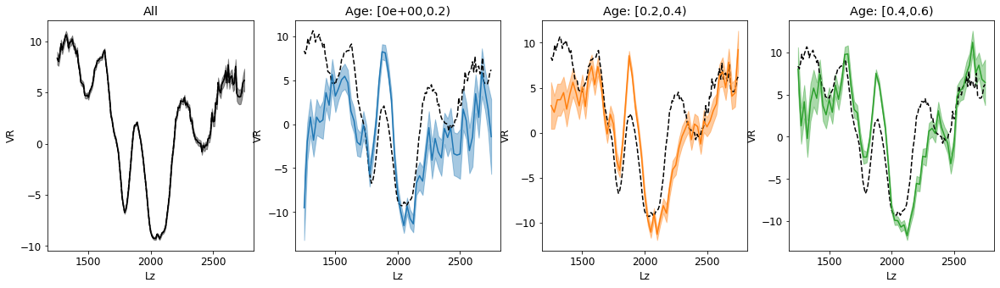

In [18]:
fig, ax = plt.subplots(1,4,figsize=(20,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error=l.load_data_ages(xmin=XMIN, xmax=XMAX, phi_range=0.4)

nx, ny, err = smooth_bins(Lz, VR, XMIN, XMAX, 10, calc_error=True)
for aax in ax:
    aax.plot(nx,ny,c='k',ls='--')
#ax[0].plot(nx,ny+err,c='k',ls='--')
#ax[0].plot(nx,ny-err,c='k',ls='--')
ax[0].plot(nx,ny,c='k')
ax[0].fill_between(nx,ny-err,ny+err,color=f'k',alpha=0.4)
ax[0].set_title(f'All')
ax[0].set_xlabel('Lz')
ax[0].set_ylabel('VR')
#nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
#ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = np.arange(0,0.7,0.2)
for limi, low, high in zip(range(len(lims)), lims[:-1],lims[1:]):
    ind = (low <= age) & (age < high)
    nx, ny, err = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 25, calc_error=True)
    ax[limi+1].plot(nx,ny,c=f'C{limi}')
    #ax[limi+1].plot(nx,ny+err,ls='--',c=f'C{limi}')
    #ax[limi+1].plot(nx,ny-err,ls='--',c=f'C{limi}')
    ax[limi+1].fill_between(nx,ny-err,ny+err,color=f'C{limi}',alpha=0.4)
    ax[limi+1].set_title(f'Age: [{low:.1},{high:.1})')
    ax[limi+1].set_xlabel('Lz')
    ax[limi+1].set_ylabel('VR')
    N = 100000
    f = interpolate.interp1d(nx, ny, kind='linear')
    xpol = np.linspace(nx[0], nx[-1], N)
    ypol = f(xpol)
    xpol = xpol[~np.isnan(ypol)]
    ypol = ypol[~np.isnan(ypol)]
    N = len(ypol)
    #ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
    #yf = fft(ypol)
    #xf = fftfreq(N)
    #yf = yf[xf>0]
    #xf = xf[xf>0]
    #xfr = ((nx[-1]-nx[0]) / abs(xf * N))
    #ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)))
    #ax[1].set_xlim(1/max(xfr), 1/xfr[100])
    #ax[1].set_xscale('log')

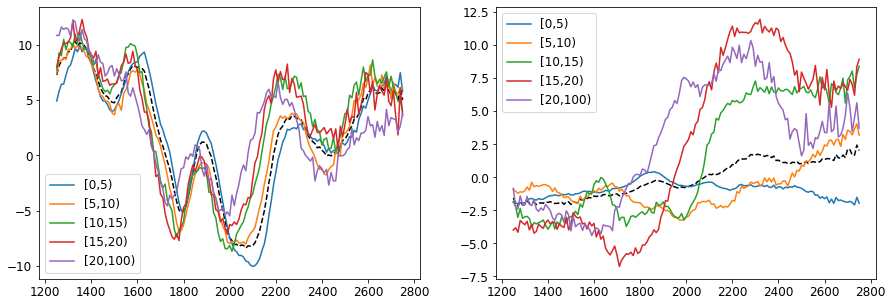

In [194]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=0.4)
#ax[0].hist(Jr,bins=np.arange(0,100,1))

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
ax[0].plot(nx,ny,c='k',ls='--')
nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
ax[1].plot(nx,ny,c='k',ls='--')

lims = [0,5,10,15,20,100]
for low, high in zip(lims[:-1],lims[1:]):
    ind = (low <= Jz) & (Jz < high)
    nx, ny = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 10)
    ax[0].plot(nx,ny,label=f'[{low},{high})')
    nx, ny = smooth_bins(Lz[ind], VZ[ind], XMIN, XMAX, 10)
    ax[1].plot(nx,ny,label=f'[{low},{high})')
ax[0].legend()
ax[1].legend()

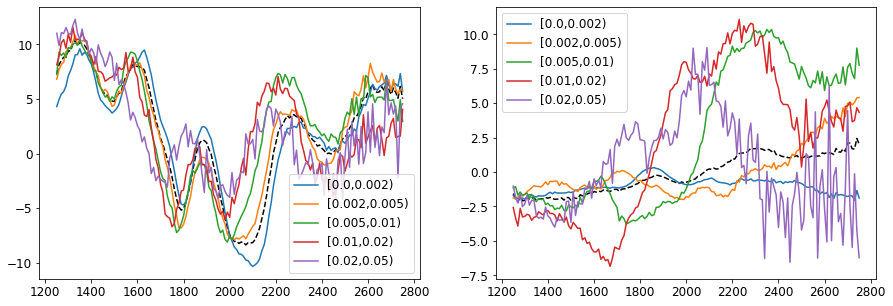

In [17]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=0.4)
Jnorm = np.sqrt(Lz**2 + Jz**2 + Jr**2)
Jphin, Jzn, Jrn = Lz/Jnorm, Jz/Jnorm, Jr/Jnorm
#ax[0].hist(Jzn,bins=np.arange(0,0.1,.001))

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
ax[0].plot(nx,ny,c='k',ls='--')
nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
ax[1].plot(nx,ny,c='k',ls='--')

lims = [0,.005,.01,.05]
lims = [.0,.002,.005,.01,.02,.05]
for limi, low, high in zip(range(len(lims)), lims[:-1],lims[1:]):
    ind = (low <= Jzn) & (Jzn < high)
    nx, ny, err = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 10, calc_error=True)
    ax[0].plot(nx,ny,label=f'[{low},{high})',color=f'C{limi}')
    #if limi==2:
    #    ax[0].fill_between(nx,ny-err,ny+err,color=f'C{limi}',alpha=0.4)
    nx, ny = smooth_bins(Lz[ind], VZ[ind], XMIN, XMAX, 10)
    ax[1].plot(nx,ny,label=f'[{low},{high})')
ax[0].legend()
ax[1].legend()

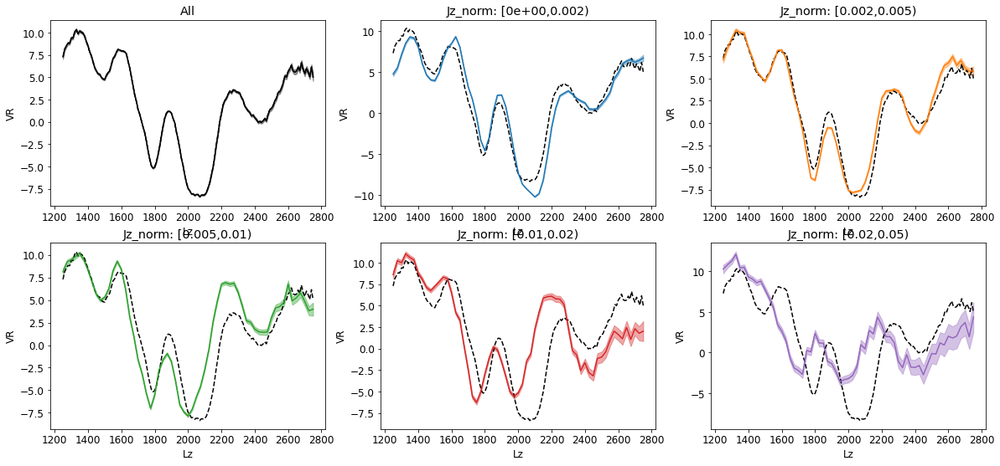

In [16]:
fig, ax = plt.subplots(2,3,figsize=(20,9))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=0.4)
Jnorm = np.sqrt(Lz**2 + Jz**2 + Jr**2)
Jphin, Jzn, Jrn = Lz/Jnorm, Jz/Jnorm, Jr/Jnorm

nx, ny, err = smooth_bins(Lz, VR, XMIN, XMAX, 10, calc_error=True)
for aax in ax:
    for aaax in aax:
        aaax.plot(nx,ny,c='k',ls='--')
#ax[0][0].plot(nx,ny+err,c='k',ls='--')
#ax[0][0].plot(nx,ny-err,c='k',ls='--')
ax[0][0].plot(nx,ny,c='k')
ax[0][0].fill_between(nx,ny-err,ny+err,color=f'k',alpha=0.4)
ax[0][0].set_title(f'All')
ax[0][0].set_xlabel('Lz')
ax[0][0].set_ylabel('VR')
#nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
#ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = [.0,.002,.005,.01,.02,.05]
for limi, low, high in zip(range(len(lims)), lims[:-1],lims[1:]):
    ind = (low <= Jzn) & (Jzn < high)
    nx, ny, err = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 25, calc_error=True)
    rax = ax[(limi+1)//3][(limi+1)%3]
    rax.plot(nx,ny,c=f'C{limi}')
    #rax.plot(nx,ny+err,ls='--',c=f'C{limi}')
    #rax.plot(nx,ny-err,ls='--',c=f'C{limi}')
    rax.fill_between(nx,ny-err,ny+err,color=f'C{limi}',alpha=0.4)
    rax.set_title(f'Jz_norm: [{low:.1},{high:.1})')
    rax.set_xlabel('Lz')
    rax.set_ylabel('VR')
    N = 100000
    f = interpolate.interp1d(nx, ny, kind='linear')
    xpol = np.linspace(nx[0], nx[-1], N)
    ypol = f(xpol)
    xpol = xpol[~np.isnan(ypol)]
    ypol = ypol[~np.isnan(ypol)]
    N = len(ypol)
    #ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
    #yf = fft(ypol)
    #xf = fftfreq(N)
    #yf = yf[xf>0]
    #xf = xf[xf>0]
    #xfr = ((nx[-1]-nx[0]) / abs(xf * N))
    #ax[1].plot(1/xfr, np.abs(yf)/np.sum(np.abs(yf)))
    #ax[1].set_xlim(1/max(xfr), 1/xfr[100])
    #ax[1].set_xscale('log')

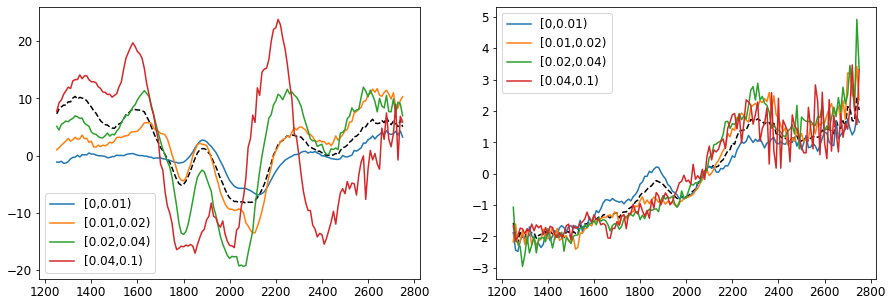

In [5]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=0.4)
Jnorm = np.sqrt(Lz**2 + Jz**2 + Jr**2)
Jphin, Jzn, Jrn = Lz/Jnorm, Jz/Jnorm, Jr/Jnorm
#ax[0].hist(Jrn,bins=np.arange(0,0.1,.001))

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
ax[0].plot(nx,ny,c='k',ls='--')
nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
ax[1].plot(nx,ny,c='k',ls='--')

lims = [0,.01,.02,.04,.1]
for low, high in zip(lims[:-1],lims[1:]):
    ind = (low <= Jrn) & (Jrn < high)
    nx, ny = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 10)
    ax[0].plot(nx,ny,label=f'[{low},{high})')
    nx, ny = smooth_bins(Lz[ind], VZ[ind], XMIN, XMAX, 10)
    ax[1].plot(nx,ny,label=f'[{low},{high})')
ax[0].legend()
ax[1].legend()

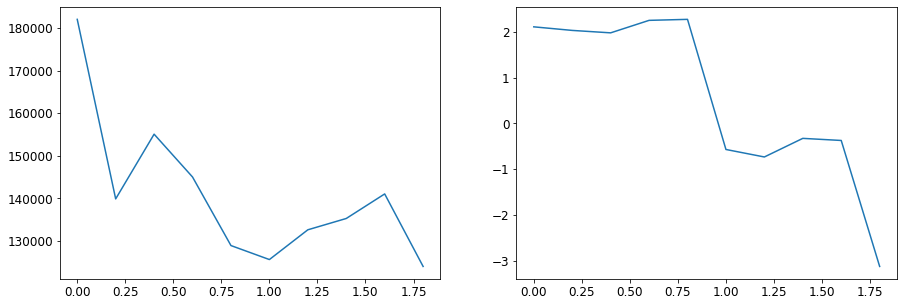

In [27]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,age,age_error=l.load_data_ages(xmin=XMIN, xmax=XMAX, phi_range=0.4)

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
#ax[0].plot(nx,ny,c='k',ls='--')
#nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
#ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = np.arange(0,2.1,0.2)
ampls = []
phases = []
for low, high in zip(lims[:-1],lims[1:]):
    ind = (low <= age) & (age < high)
    nx, ny = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 25)
    #ax[0].plot(nx,ny,label=f'[{low},{high})')
    N = 100000
    f = interpolate.interp1d(nx, ny, kind='linear')
    xpol = np.linspace(nx[0], nx[-1], N)
    ypol = f(xpol)
    xpol = xpol[~np.isnan(ypol)]
    ypol = ypol[~np.isnan(ypol)]
    N = len(ypol)
    #ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
    yf = fft(ypol)
    xf = fftfreq(N)
    yf = yf[xf>0]
    xf = xf[xf>0]
    ampl = np.max(np.abs(yf[2:]))
    ampls.append(ampl)
    phase = np.angle(yf[np.argmax(np.abs(yf[2:]))])
    phases.append(phase)

    xfr = ((nx[-1]-nx[0]) / abs(xf * N))
    #ax[1].plot(1/xfr, np.abs(yf))
    #ax[1].set_xlim(1/max(xfr), 1/xfr[100])
    #ax[1].set_xscale('log')

ax[0].plot(lims[:-1], ampls)
ax[1].plot(lims[:-1], phases)

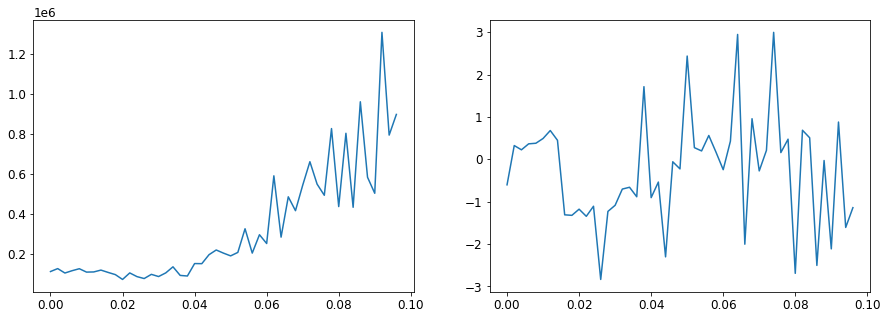

In [30]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=0.4)
Jnorm = np.sqrt(Lz**2 + Jz**2 + Jr**2)
Jphin, Jzn, Jrn = Lz/Jnorm, Jz/Jnorm, Jr/Jnorm

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
#ax[0].plot(nx,ny,c='k',ls='--')
#nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
#ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = np.arange(0,0.1,0.002)
ampls = []
phases = []
for low, high in zip(lims[:-1],lims[1:]):
    ind = (low <= Jzn) & (Jzn < high)
    nx, ny = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 25)
    #ax[0].plot(nx,ny,label=f'[{low},{high})')
    N = 100000
    f = interpolate.interp1d(nx, ny, kind='linear')
    xpol = np.linspace(nx[0], nx[-1], N)
    ypol = f(xpol)
    xpol = xpol[~np.isnan(ypol)]
    ypol = ypol[~np.isnan(ypol)]
    N = len(ypol)
    #ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
    yf = fft(ypol)
    xf = fftfreq(N)
    yf = yf[xf>0]
    xf = xf[xf>0]
    ampl = np.max(np.abs(yf[2:]))
    ampls.append(ampl)
    phase = np.angle(yf[np.argmax(np.abs(yf[2:]))])
    phases.append(phase)

    xfr = ((nx[-1]-nx[0]) / abs(xf * N))
    #ax[1].plot(1/xfr, np.abs(yf))
    #ax[1].set_xlim(1/max(xfr), 1/xfr[100])
    #ax[1].set_xscale('log')

ax[0].plot(lims[:-1], ampls)
ax[1].plot(lims[:-1], phases)

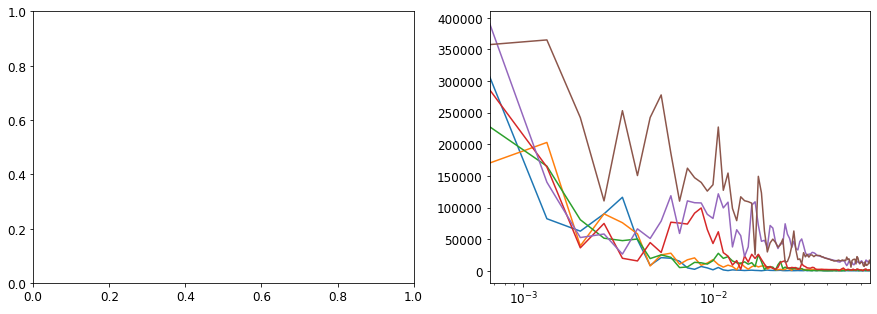

In [34]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=1250
XMAX=2750
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz,Jr=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=0.4)
Jnorm = np.sqrt(Lz**2 + Jz**2 + Jr**2)
Jphin, Jzn, Jrn = Lz/Jnorm, Jz/Jnorm, Jr/Jnorm

nx, ny = smooth_bins(Lz, VR, XMIN, XMAX, 10)
#ax[0].plot(nx,ny,c='k',ls='--')
#nx, ny = smooth_bins(Lz, VZ, XMIN, XMAX, 10)
#ax[1].plot(nx,ny,c='k',ls='--')

bs = 4
lims = np.arange(0,0.1,0.015)
ampls = []
phases = []
for low, high in zip(lims[:-1],lims[1:]):
    ind = (low <= Jzn) & (Jzn < high)
    nx, ny = smooth_bins(Lz[ind], VR[ind], XMIN, XMAX, 25)
    #ax[0].plot(nx,ny,label=f'[{low},{high})')
    N = 100000
    f = interpolate.interp1d(nx, ny, kind='linear')
    xpol = np.linspace(nx[0], nx[-1], N)
    ypol = f(xpol)
    xpol = xpol[~np.isnan(ypol)]
    ypol = ypol[~np.isnan(ypol)]
    N = len(ypol)
    #ypol = (ypol - ypol.mean()) / (ypol.max() - ypol.min())
    yf = fft(ypol)
    xf = fftfreq(N)
    yf = yf[xf>0]
    xf = xf[xf>0]
    ampl = np.max(np.abs(yf[2:]))
    ampls.append(ampl)
    phase = np.angle(yf[np.argmax(np.abs(yf[2:]))])
    phases.append(phase)

    xfr = ((nx[-1]-nx[0]) / abs(xf * N))
    ax[1].plot(1/xfr, np.abs(yf))
    ax[1].set_xlim(1/max(xfr), 1/xfr[100])
    ax[1].set_xscale('log')



Text(0, 0.5, 'Jz')

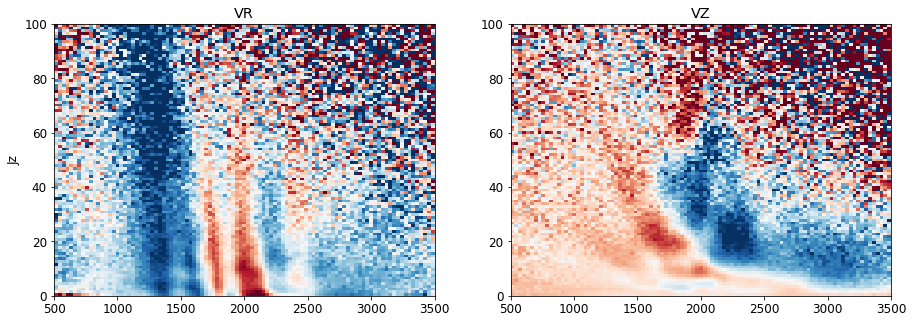

In [67]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=500
XMAX=3500
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=np.pi)

binsY=np.linspace(0,100,100)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, Jz, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, Jz, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.real(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_title('VR')
ax[1].pcolormesh(xedge, yedge, np.imag(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[1].set_title('VZ');
ax[0].set_ylabel('Jz')

Text(0, 0.5, 'Zmax')

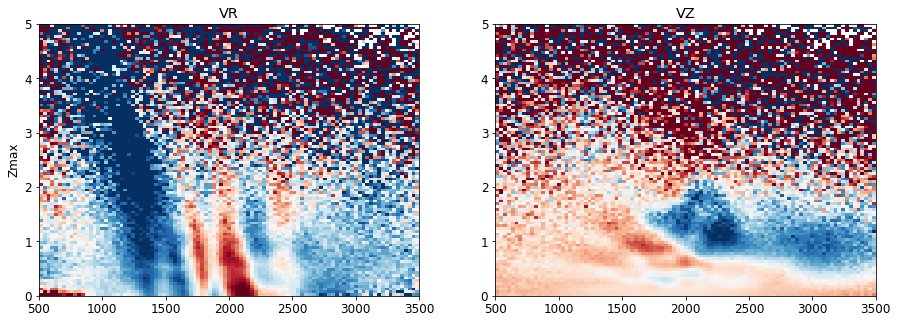

In [51]:
fig, ax = plt.subplots(1,2,figsize=(15,5))

XMIN=500
XMAX=3500
x,y,z,VR,Vphi,VZ,R,Lz,phi,Zmax,Jz=l.load_data_orbits(xmin=XMIN, xmax=XMAX, phi_range=np.pi)

binsY=np.linspace(0,5,100)
vf = VR + 1j*VZ
mVR_r,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, Zmax, np.real(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR_c,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, Zmax, np.imag(vf), statistic='mean', bins=[np.linspace(XMIN,XMAX,100),binsY])    
mVR = mVR_r + 1j * mVR_c
ax[0].pcolormesh(xedge, yedge, np.real(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_title('VR')
ax[1].pcolormesh(xedge, yedge, np.imag(mVR.T), cmap='RdBu',vmin=-10,vmax=10)
ax[1].set_title('VZ');
ax[0].set_ylabel('Zmax')

/home/hpc/anaconda3/lib/python3.9/site-packages/astropy/table/table.py:3488: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  result = self.as_array() == other

49
[0. 0. 0.]
0.6911286394015083
(49.16453555331925, 46.0)
(0.001678934217543393, -0.030612244897959162)
3.5351668545225903 3.086802361447876


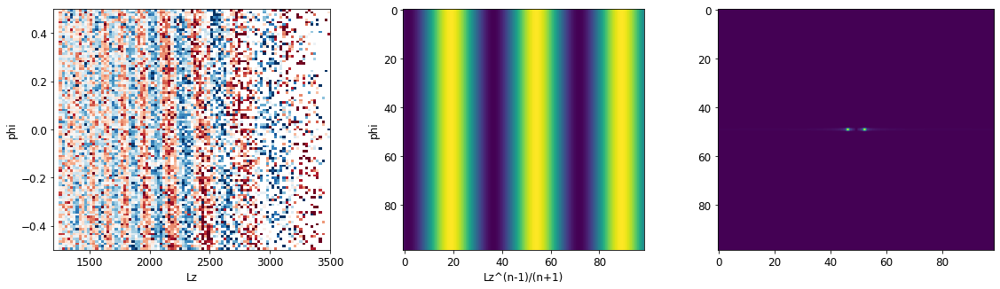

In [171]:
XMIN=1000
XMAX=3500
BINSIZE = 10
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_data(xmin=XMIN, xmax=XMAX, phi_range=np.pi, new=False)
DATA = True

XMIN=1250
XMAX=3500
x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model(model, 2.7, xmin=XMIN, xmax=XMAX, phi_range=np.pi)

fig, ax = plt.subplots(1, 3, figsize=(19,5))

VRn = VR / Lz
n = -0.1
Lzl = Lz ** ((n-1)/(n+1))
#binsX=np.linspace(1200,3500,100)
binsX=np.linspace(Lzl.min(),Lzl.max(),100)
binsY=np.linspace(-np.pi,np.pi,100)
binsX=np.linspace(Lzl.min(),0.000125,100)
binsY=np.linspace(-0.5,0.5,100)
mVR,xedge,yedge,binnumber=stats.binned_statistic_2d(Lz, phi, VR, statistic='mean', bins=[np.linspace(1200,3500,100),binsY])    
ax[0].pcolormesh(xedge, yedge, mVR.T, cmap='RdBu',vmin=-10,vmax=10)
ax[0].set_aspect('auto')
ax[0].set_xlabel('Lz')
ax[0].set_ylabel('phi')
mVR,xedge,yedge,binnumber=stats.binned_statistic_2d(Lzl, phi, VRn, statistic='mean', bins=[binsX,binsY])    
ax[1].pcolormesh(xedge, yedge, mVR.T, cmap='RdBu',vmin=-10/2500,vmax=10/2500)
ax[1].set_aspect('auto')
ax[1].set_xlabel('Lz^(n-1)/(n+1)')
ax[1].set_ylabel('phi')

mVR = np.nan_to_num(mVR)
mVR = (mVR - mVR.mean()) / (mVR.max() - mVR.min())
#plt.imshow(mVR)
x1, x2 = np.meshgrid(np.linspace(0, 1, 99), np.linspace(0, 1, 99))
mVR = 2*np.cos(2.8*x1*2*np.pi+0.9*np.pi)
ax[1].imshow(mVR)
f = fftshift(fft2(ifftshift(mVR)))
#col = np.stack([(np.angle(f)+np.pi)/(2*np.pi), abs(f)/abs(f).max(), np.ones(f.shape)], axis=-1)
#print(col)
#plt.imshow(matplotlib.colors.hsv_to_rgb(col))
f[len(f)//2, len(f)//2] = np.mean(f)
import itertools
#for dx,dy in itertools.product([-1,0,1],[-1,0,1]):
#    f[len(f)//2+dx, len(f)//2+dy] = np.mean(f)
#ax[2].imshow(abs(f))
ax[2].imshow(abs(f))
#ax[1].imshow(np.sqrt(abs(f)))
ax[2].set_aspect('auto')

maximum = np.unravel_index(np.argmax(abs(f)), f.shape)
maxval = f[maximum]
#fab = abs(f)[maximum[0]-1:maximum[0]+1+1, maximum[1]-1:maximum[1]+1+1]
#xsh = -fab[:,0].sum()/fab[:,:2].sum() if fab[:,0].sum() > fab[:,2].sum() else fab[:,2].sum()/fab[:,1:].sum()
#ysh = -fab[0,:].sum()/fab[:2,:].sum() if fab[0,:].sum() > fab[2,:].sum() else fab[2,:].sum()/fab[1:,:].sum()
#maximum = (maximum[0]+xsh, maximum[1]+ysh)
print((-np.angle(maxval)%(np.pi))/np.pi)
print(maximum)
maximum = (maximum[0]/(len(f)-1)-0.5, maximum[1]/(len(f)-1)-0.5)
print(maximum)
freq = np.linalg.norm(maximum)*len(f) + 0.5
angle = np.arctan2(*maximum)%np.pi
print(freq, angle)


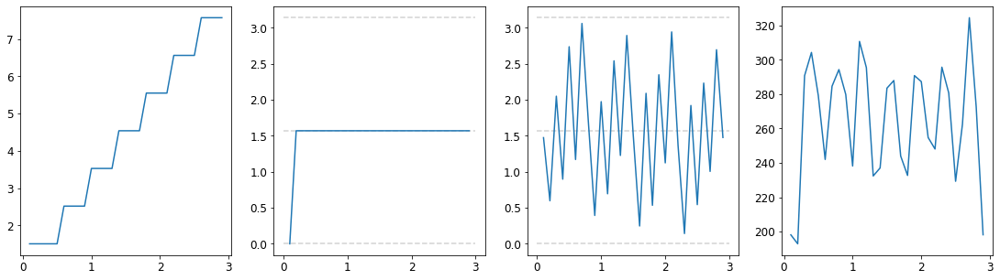

In [172]:
times = np.arange(.1,3.0,.1)
fig, ax = plt.subplots(1, 4, figsize=(19,5))
freqs = []
angles = []
phases = []
amplitudes = []

#model = 'Dhot_log'
#model = 'Dhot_log_2perturb'
#model = 'Dhotn10_pn10'
model = 'Dhotn_10_pn_10'

for time in times:
    XMIN=1250
    XMAX=3500
    x,y,z,VR,Vphi,VZ,R,Lz,phi=l.load_model(model, time, xmin=XMIN, xmax=XMAX, phi_range=np.pi)

    VRn = VR / Lz
    binsX=np.linspace(Lzl.min(),Lzl.max(),100)
    binsY=np.linspace(-np.pi,np.pi,100)
    binsX=np.linspace(Lzl.min(),0.000125,100)
    binsY=np.linspace(-0.5,0.5,100)
    n = -0.1
    Lzl = Lz ** ((n-1)/(n+1))
    mVR,xedge,yedge,binnumber=stats.binned_statistic_2d(Lzl, phi, VRn, statistic='mean', bins=[binsX,binsY])    
    #ax[0].pcolormesh(xedge, yedge, mVR.T, cmap='RdBu',vmin=-10/2500,vmax=10/2500)

    mVR = np.nan_to_num(mVR)
    mVR = (mVR - mVR.mean()) / (mVR.max() - mVR.min())
    f = fftshift(fft2(ifftshift(mVR)))
    f[len(f)//2, len(f)//2] = np.mean(f)
    
    maximum = np.unravel_index(np.argmax(abs(f)), f.shape)
    maxval = f[maximum]
    #fab = abs(f)[maximum[0]-1:maximum[0]+1+1, maximum[1]-1:maximum[1]+1+1]
    #xsh = -fab[:,0].sum()/fab[:,:2].sum() if fab[:,0].sum() > fab[:,2].sum() else fab[:,2].sum()/fab[:,1:].sum()
    #ysh = -fab[0,:].sum()/fab[:2,:].sum() if fab[0,:].sum() > fab[2,:].sum() else fab[2,:].sum()/fab[1:,:].sum()
    #maximum = (maximum[0]+xsh, maximum[1]+ysh)
    phase = (-np.angle(maxval))%(np.pi)
    amplitude = np.abs(maxval)
    maximum = (maximum[0]/(len(f)-1)-0.5, maximum[1]/(len(f)-1)-0.5)
    freq = np.linalg.norm(maximum)*len(f)+0.5
    angle = np.arctan2(*maximum)%np.pi
    freqs.append(freq)
    angles.append(angle)
    phases.append(phase)
    amplitudes.append(amplitude)
    #print(time, freq, angle)

ax[0].plot(times, freqs)
ax[1].hlines([0,np.pi/2,np.pi],0,3,ls='--',color='lightgrey')
ax[1].plot(times, angles)
ax[2].hlines([0,np.pi/2,np.pi],0,3,ls='--',color='lightgrey')
from scipy.signal import hilbert
ax[2].plot(times, phases)
ax[3].plot(times, amplitudes)